In [1]:
import os
os.environ['CUDA_DEVICE_ORDER'] = 'PCI_BUS_ID'
os.environ['CUDA_VISIBLE_DEVICES'] = '4'

In [2]:
import numpy as np
import pandas as pd

# import tqdm.notebook as tq
import tqdm as tq

import random

import torch
import torch.nn as nn

from torch.utils.data import Dataset, DataLoader

from sklearn.preprocessing import OneHotEncoder

import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = [30, 10]

In [3]:
random_seed = 13

torch.manual_seed(random_seed)
random.seed(random_seed)
np.random.seed(random_seed)

In [4]:
dataset = 'FordA'

from sktime.datasets import load_UCR_UEA_dataset

X_train, y_train = load_UCR_UEA_dataset(name=dataset, split='train', return_type='numpyflat')
X_test, y_test = load_UCR_UEA_dataset(name=dataset, split='test', return_type='numpyflat')

In [5]:
print(f'Length training data: {len(X_train)} labels: {len(y_train)} test data: {len(X_test)} labels: {len(y_test)}')

Length training data: 3601 labels: 3601 test data: 1320 labels: 1320


In [6]:
encoder = OneHotEncoder(categories='auto', sparse_output=False)

y_train_ohe = encoder.fit_transform(np.expand_dims(y_train, axis=-1))
y_test_ohe = encoder.transform(np.expand_dims(y_test, axis=-1))

y_train_norm = y_train_ohe.argmax(axis=-1)
y_test_norm = y_test_ohe.argmax(axis=-1)

In [7]:
class FordADataset(Dataset):

    def __init__(self, X, y):
        self.X = X
        self.y = y
    
    def __len__(self):
        return len(self.X)
    
    def __getitem__(self, idx):
        inputs = self.X[idx]
        label = self.y[idx]
        
        return inputs, label

In [8]:
dataset_train = FordADataset(X_train, y_train_ohe)
dataset_test = FordADataset(X_test, y_test_ohe)

In [9]:
dataloader_train = DataLoader(dataset_train, batch_size=120, shuffle=True)
dataloader_train_not_shuffled = DataLoader(dataset_train, batch_size=120, shuffle=False)
dataloader_test = DataLoader(dataset_test, batch_size=120, shuffle=False)

In [10]:
import torch
from torch import nn
import torch.nn.functional as F


class Conv1dSamePadding(nn.Conv1d):
    """Represents the "Same" padding functionality from Tensorflow.
    See: https://github.com/pytorch/pytorch/issues/3867
    Note that the padding argument in the initializer doesn't do anything now
    """
    def forward(self, input):
        kernel, dilation, stride = self.weight.size(2), self.dilation[0], self.stride[0]
        
        l_out = l_in = input.size(2)
    
        padding = (((l_out - 1) * stride) - l_in + (dilation * (kernel - 1)) + 1)
        if padding % 2 != 0:
            input = F.pad(input, [0, 1])

        return F.conv1d(input=input, weight=self.weight, bias=self.bias, stride=stride, padding=padding // 2, dilation=dilation, groups=self.groups)


class ResNetBlock(nn.Module):

    def __init__(self, in_channels, out_channels):
        super().__init__()

        channels = [in_channels, out_channels, out_channels, out_channels]
        kernel_sizes = [5, 3, 1]

        layers = []
        for i in range(len(kernel_sizes)):
            layers += [
                Conv1dSamePadding(in_channels=channels[i], out_channels=channels[i + 1], kernel_size=kernel_sizes[i], stride=1),
                nn.BatchNorm1d(num_features=channels[i + 1]),
                nn.ReLU(),
            ]
        self.layers = nn.Sequential(*layers)

        self.match_channels = False
        if in_channels != out_channels:
            self.match_channels = True
            self.residual = nn.Sequential(*[
                Conv1dSamePadding(in_channels=in_channels, out_channels=out_channels, kernel_size=1, stride=1),
                nn.BatchNorm1d(num_features=out_channels)
            ])

    def forward(self, x):
        if self.match_channels:
            return self.layers(x) + self.residual(x)
        return self.layers(x)


class ResNet(nn.Module):
    def __init__(self):
        super().__init__()
        
        num_pred_classes = 2
        in_channels = 1
        mid_channels = 10
        
        self.layers = nn.Sequential(*[
            ResNetBlock(in_channels=in_channels, out_channels=mid_channels),
            ResNetBlock(in_channels=mid_channels, out_channels=mid_channels * 2),
            ResNetBlock(in_channels=mid_channels * 2, out_channels=mid_channels * 2),

        ])
        self.fc = nn.Sequential(
            nn.Linear(mid_channels * 2, num_pred_classes),
            nn.Softmax(-1)
        )

        
    def forward(self, x):
        x = self.layers(x)
        x = x.mean(dim=-1)
        x = self.fc(x)
        
        return x

# Training of the model

In [11]:
def trainer(model, dataloader_train, criterion):
    running_loss = 0

    model.train()

    for idx, (inputs, labels) in enumerate(dataloader_train):
        inputs = inputs.reshape(inputs.shape[0], 1, -1)
        inputs = inputs.float().to(device)
        labels = labels.float().to(device)

        optimizer.zero_grad()
        preds = model(inputs)
        loss = criterion(preds, labels.argmax(dim=-1))
        loss.backward()
        optimizer.step()
        
        running_loss += loss.item()

    train_loss = running_loss / len(dataloader_train)
    
    return train_loss


def validator(model, dataloader_test, criterion):
    running_loss = 0

    model.eval()

    for idx, (inputs, labels) in enumerate(dataloader_test):
        inputs = inputs.reshape(inputs.shape[0], 1, -1)
        inputs = inputs.float().to(device)
        labels = labels.float().to(device)

        preds = model(inputs)
        loss = criterion(preds, labels.argmax(dim=-1))
        
        running_loss += loss.item()

    train_loss = running_loss / len(dataloader_train)
    
    return train_loss

In [12]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = ResNet().to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)
loss = nn.CrossEntropyLoss()

In [13]:
epochs = 500

for epoch in range(epochs):
    train_loss = trainer(model, dataloader_train, loss)
    if epoch % 10 == 0:
        print(f'Val {validator(model, dataloader_test, loss):}')
        print('Train', train_loss)

Val 0.24500750726269138
Train 0.6814127660566761
Val 0.202545331370446
Train 0.5884037959960199
Val 0.18466267758800137
Train 0.5358938767064002
Val 0.17497863981031603
Train 0.5057488997136393
Val 0.16699400832576136
Train 0.4863893581974891
Val 0.1651658127384801
Train 0.47023244250205254
Val 0.15932522954479342
Train 0.4582982928522171
Val 0.15733491316918405
Train 0.45198316727915117
Val 0.15497941643961013
Train 0.44523012926501615
Val 0.1532443117710852
Train 0.4394406714747029
Val 0.1536528689246024
Train 0.4332467721354577
Val 0.15084074870232614
Train 0.4322403880857652
Val 0.1537712283672825
Train 0.4258950525714505
Val 0.1502491399165123
Train 0.4237887465184735
Val 0.14877833762476522
Train 0.41768403591648223
Val 0.14803215572910924
Train 0.4198086569386144
Val 0.14681706601573574
Train 0.4137718004565085
Val 0.14635046547459019
Train 0.41446317203583255
Val 0.14957499215679784
Train 0.411233760656849
Val 0.14610413293684682
Train 0.4071705956612864
Val 0.14517973123058195

In [14]:
model.eval()

preds = []
labels = []
for x in dataloader_train_not_shuffled:
    input_, label_ = x
    input_ = input_.reshape(input_.shape[0], 1, -1)
    input_ = input_.float().to(device)
    label_ = label_.float().to(device)

    pred_ = model(input_)
    preds.extend(pred_)
    labels.extend(label_)

preds = torch.stack(preds)
labels = torch.stack(labels)
print('Prediction Accuracy Train', np.round((preds.argmax(dim=-1) == labels.argmax(dim=-1)).int().sum().float().item() / len(preds), 4))

y_train_pred = preds.cpu().detach().numpy().round(3)

Prediction Accuracy Train 0.9761


In [15]:
model.eval()

preds = []
labels = []
for x in dataloader_test:
    input_, label_ = x
    input_ = input_.reshape(input_.shape[0], 1, -1)
    input_ = input_.float().to(device)
    label_ = label_.float().to(device)

    pred_ = model(input_)
    preds.extend(pred_)
    labels.extend(label_)

preds = torch.stack(preds)
labels = torch.stack(labels)
print('Prediction Accuracy Test', np.round((preds.argmax(dim=-1) == labels.argmax(dim=-1)).int().sum().float().item() / len(preds), 4))

y_test_pred = preds.cpu().detach().numpy().round(3)

Prediction Accuracy Test 0.9545


# Save results as json

In [16]:
%load_ext autoreload
%autoreload 2

In [17]:
import exp_perturbation_analysis as exp_pa

import exp_stability_indicator as exp_si

import exp_plots as exp_pl

import scipy as sp

In [18]:
from captum.attr import GradientShap, DeepLiftShap, IntegratedGradients, ShapleyValueSampling, Saliency, DeepLift

In [19]:
import matplotlib as mpl

cmap = 'tab10'

In [20]:
attribution_measure = exp_si.attribution_stability_indicator
get_asi_for_dataset = exp_si.get_asi_for_dataset

In [21]:
sample_idx = 2
sample_ts_np, sample_l = dataloader_test.dataset[sample_idx]

sample, label = dataset_train[0]
shape = sample_ts_np.reshape(1, -1).shape

baselines = torch.from_numpy(np.array([dataset_test[torch.randint(len(dataset_test), (1,))][0] for _ in range(10)])).reshape(-1, *shape).float().to(device)



attribution_techniques = [
    ['Saliency', Saliency, {}],
    ['GradientShap', GradientShap, {'baselines': baselines}],
    
    ['DeepLift', DeepLift, {}],
    ['DeepLiftShap', DeepLiftShap, {'baselines': baselines}],
    
    ['IntegratedGradients', IntegratedGradients, {}],
    
#     ['ShapleyValueSampling', ShapleyValueSampling, {}],
]

for at in tq.tqdm(attribution_techniques):
    at_name, at_class, at_kwargs = at
    asi_core_tmp = attribution_measure(model, sample_ts_np, sample_l, at_class, at_kwargs, debug=True, weights=[0.5, 1, 0.5, 3], perturbation_fnc=exp_pa.ood_l)

  0%|          | 0/5 [00:00<?, ?it/s]/home/schlegel/.conda/captum/lib/python3.10/site-packages/captum/_utils/gradient.py:57: UserWarning: Input Tensor 0 did not already require gradients, required_grads has been set automatically.
  warnings.warn(
/home/schlegel/.conda/captum/lib/python3.10/site-packages/captum/attr/_core/deep_lift.py:304: UserWarning: Setting forward, backward hooks and attributes on non-linear
               activations. The hooks and attributes will be removed
            after the attribution is finished
  warnings.warn(
100%|██████████| 5/5 [00:00<00:00, 22.43it/s]

XAI: Saliency
Original Pred:  [0.975383 0.024617]
Perturbed Pred: [1. 0.]

TS Correl: 0.7579782481953112
Att Correl: 0.5

Labels
TL  P1  Pd
 0   0   0

ASI
0.65351

XAI: GradientShap
Original Pred:  [0.975383 0.024617]
Perturbed Pred: [1. 0.]

TS Correl: 0.8096033822382255
Att Correl: 0.5

Labels
TL  P1  Pd
 0   0   0

ASI
0.65867

XAI: DeepLift
Original Pred:  [0.975383 0.024617]
Perturbed Pred: [1. 0.]

TS Correl: 0.641419916840587
Att Correl: 0.5165100661888903

Labels
TL  P1  Pd
 0   0   0

ASI
0.65176

XAI: DeepLiftShap
Original Pred:  [0.975383 0.024617]
Perturbed Pred: [1. 0.]

TS Correl: 0.6586113943183015
Att Correl: 0.5670195991615758

Labels
TL  P1  Pd
 0   0   0

ASI
0.68378

XAI: IntegratedGradients
Original Pred:  [0.975383 0.024617]
Perturbed Pred: [1. 0.]

TS Correl: 0.5795485739039266
Att Correl: 0.5

Labels
TL  P1  Pd
 0   0   0

ASI
0.63567



In [22]:
loader = dataloader_train_not_shuffled
ret_train = get_asi_for_dataset(loader, model, attribution_techniques, [0.5, 1, 0.5, 3], exp_pa.ood_l)

100%|██████████| 3601/3601 [16:22<00:00,  3.67it/s]


In [23]:
loader = dataloader_test
ret_test = get_asi_for_dataset(loader, model, attribution_techniques, [0.5, 1, 0.5, 3], exp_pa.ood_l)

100%|██████████| 1320/1320 [04:50<00:00,  4.54it/s]


In [24]:
generate_projections = exp_pl.generate_projections
generate_histogram = exp_pl.generate_histogram

Name: Saliency
ASI: 1874.117, Flips: 1722, Accuracy before 0.9761, after 0.5135


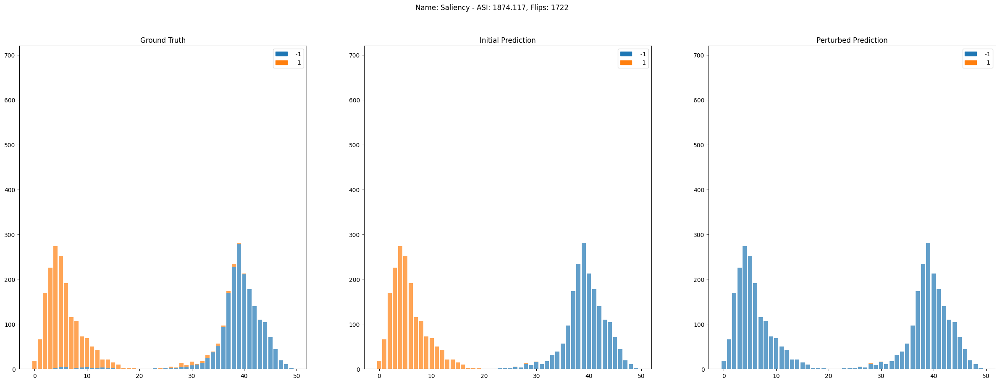

Name: GradientShap
ASI: 1902.418, Flips: 1725, Accuracy before 0.9761, after 0.5126


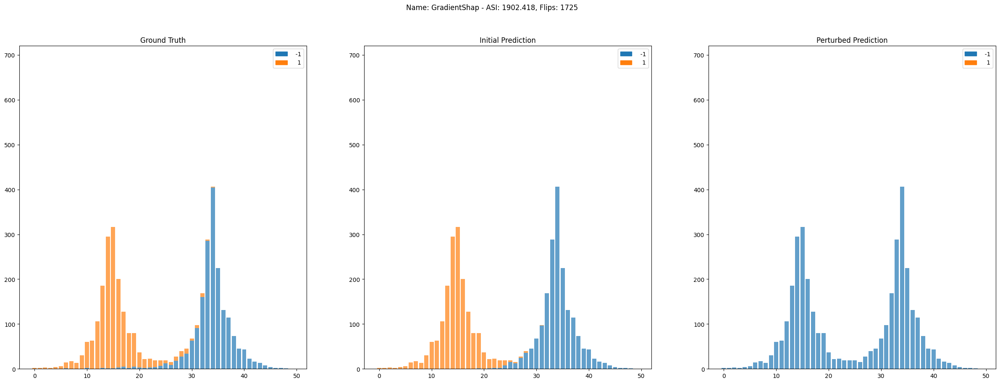

Name: DeepLift
ASI: 1921.934, Flips: 1725, Accuracy before 0.9761, after 0.5126


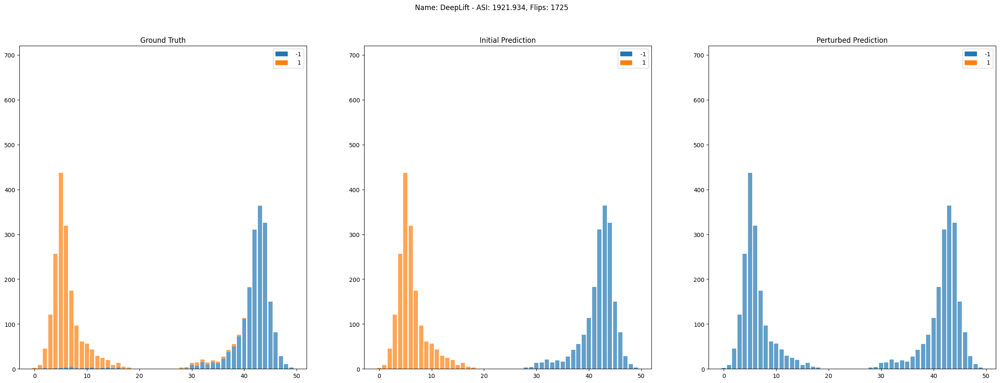

Name: DeepLiftShap
ASI: 1942.029, Flips: 1725, Accuracy before 0.9761, after 0.5126


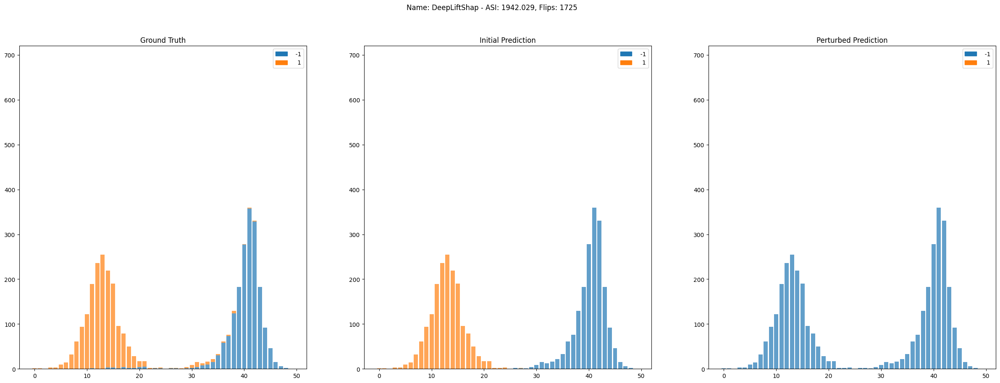

Name: IntegratedGradients
ASI: 1923.974, Flips: 1725, Accuracy before 0.9761, after 0.5126


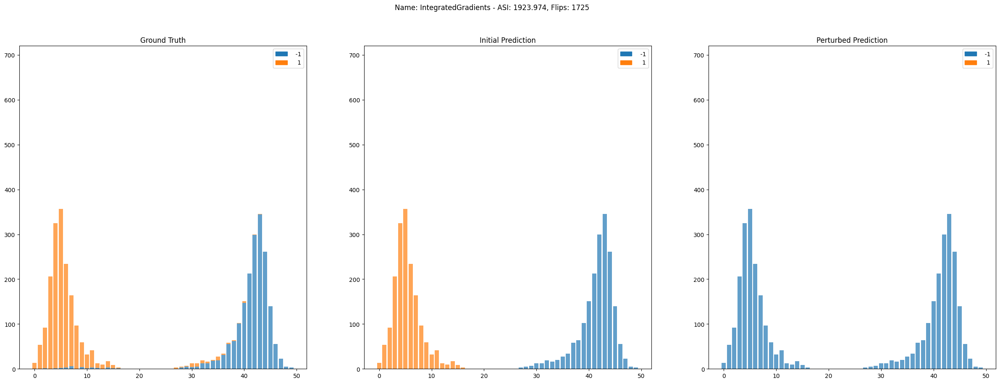

In [39]:
generate_histogram(ret_train, labels=list(np.unique(y_train)))

Name: Saliency
ASI: 1874.117, Flips: 1722


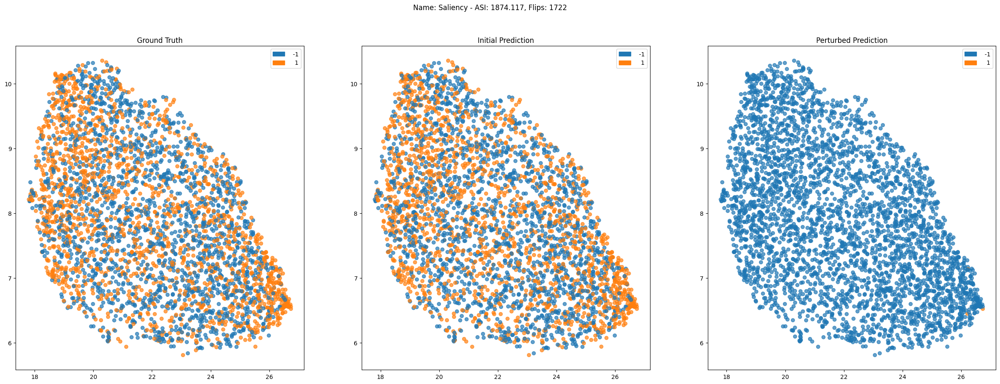

Name: GradientShap
ASI: 1902.418, Flips: 1725


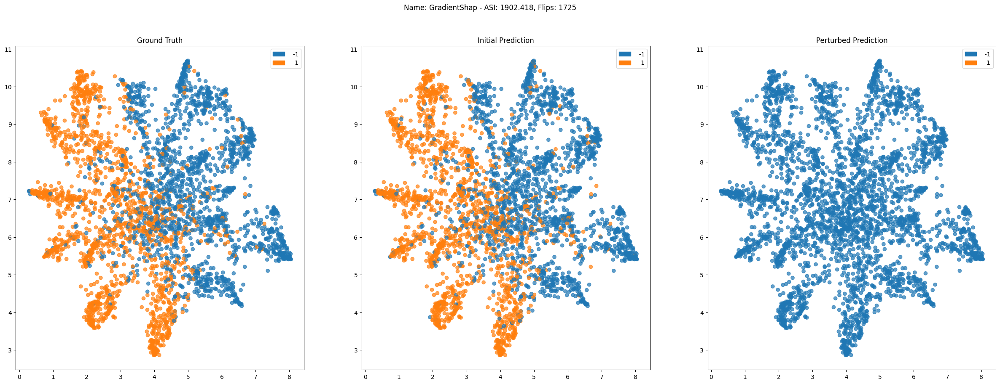

Name: DeepLift
ASI: 1921.934, Flips: 1725


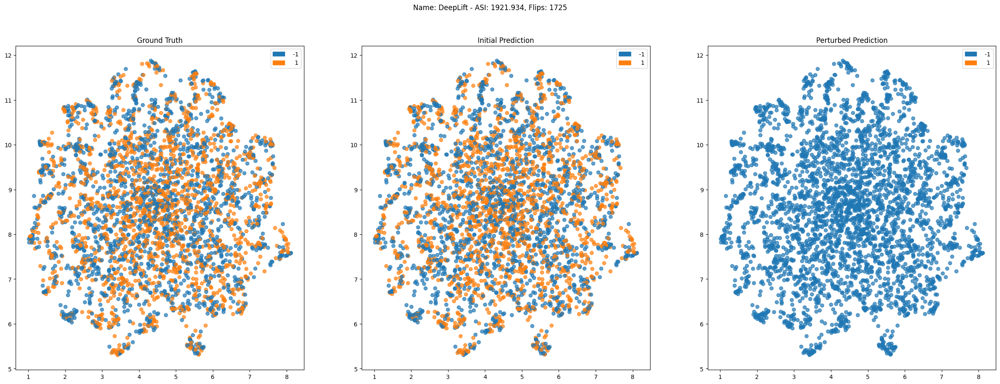

Name: DeepLiftShap
ASI: 1942.029, Flips: 1725


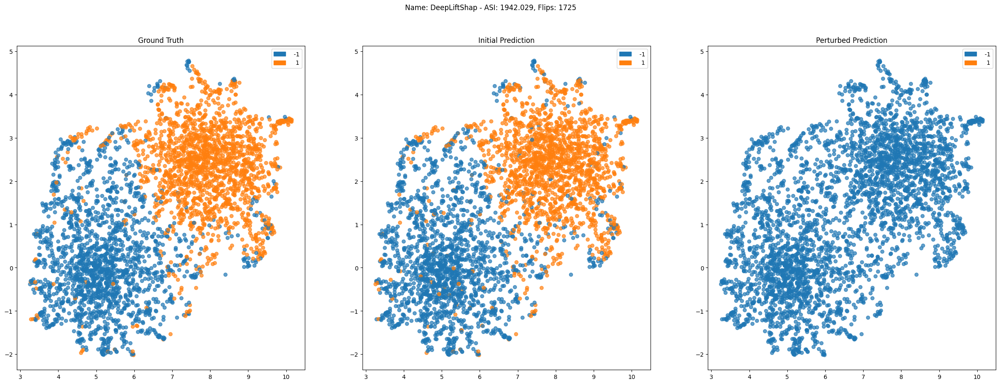

Name: IntegratedGradients
ASI: 1923.974, Flips: 1725


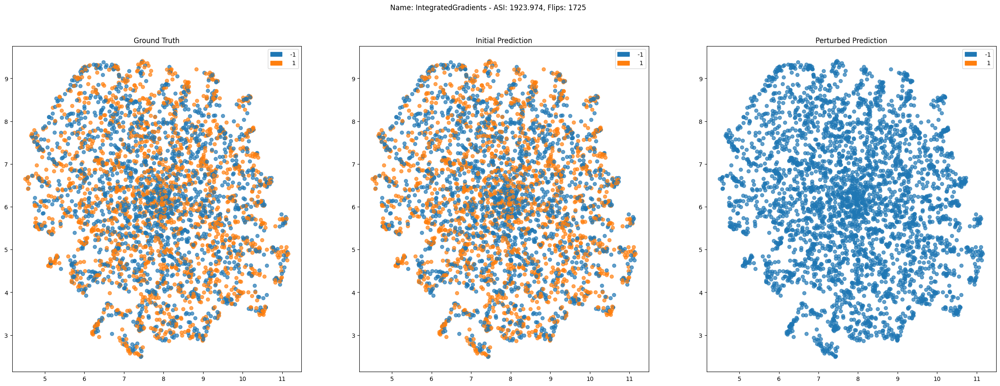

In [40]:
generate_projections(ret_train, labels=list(np.unique(y_train)))

Name: Saliency
ASI: 687.866, Flips: 612, Accuracy before 0.9545, after 0.5212


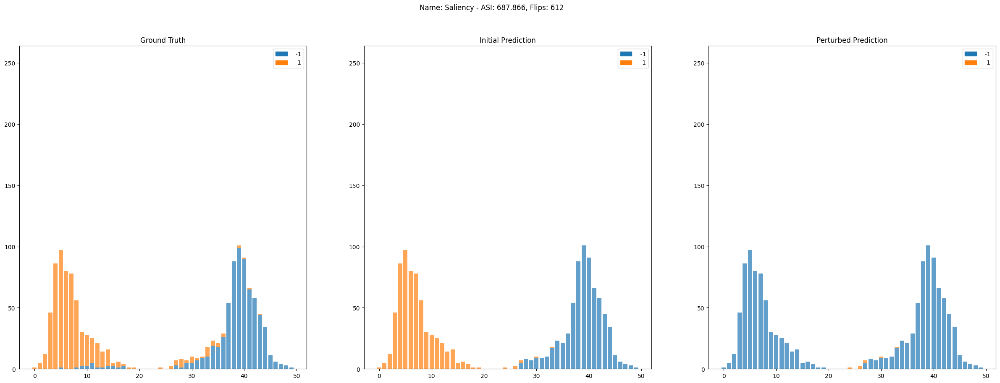

Name: GradientShap
ASI: 694.076, Flips: 619, Accuracy before 0.9545, after 0.5159


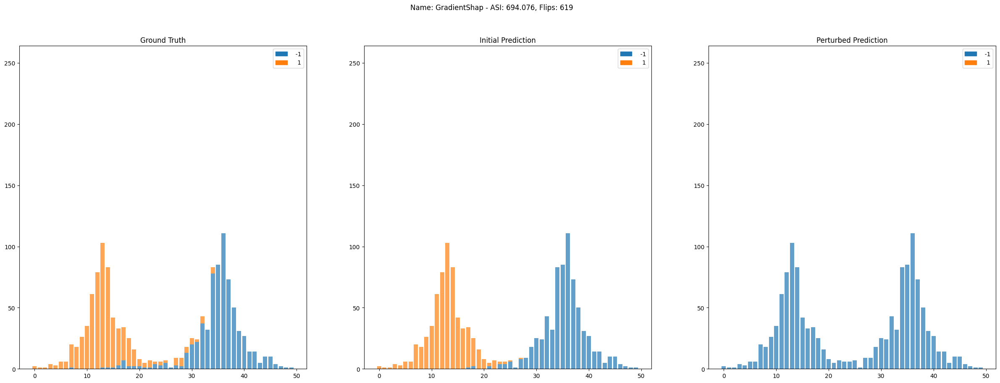

Name: DeepLift
ASI: 705.146, Flips: 619, Accuracy before 0.9545, after 0.5159


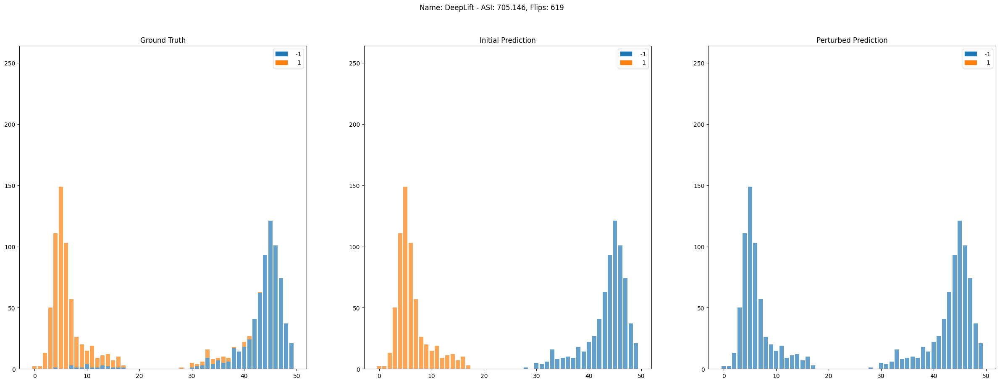

Name: DeepLiftShap
ASI: 714.969, Flips: 619, Accuracy before 0.9545, after 0.5159


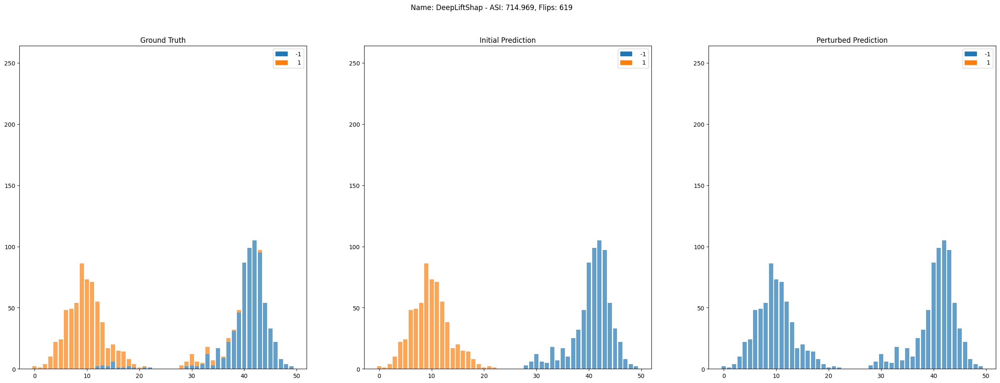

Name: IntegratedGradients
ASI: 704.352, Flips: 619, Accuracy before 0.9545, after 0.5159


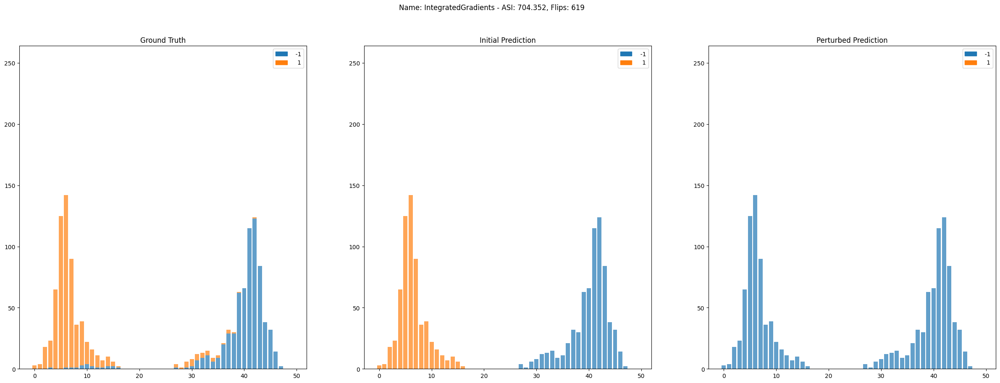

In [41]:
generate_histogram(ret_test, labels=list(np.unique(y_train)))

Name: Saliency
ASI: 687.866, Flips: 612


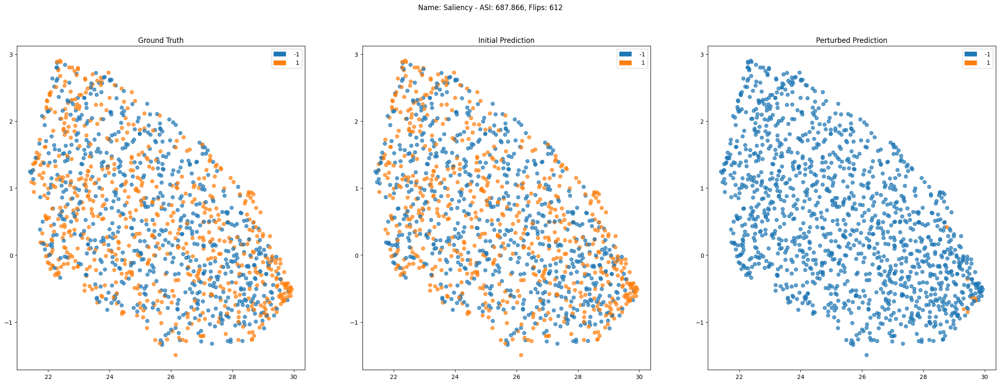

Name: GradientShap
ASI: 694.076, Flips: 619


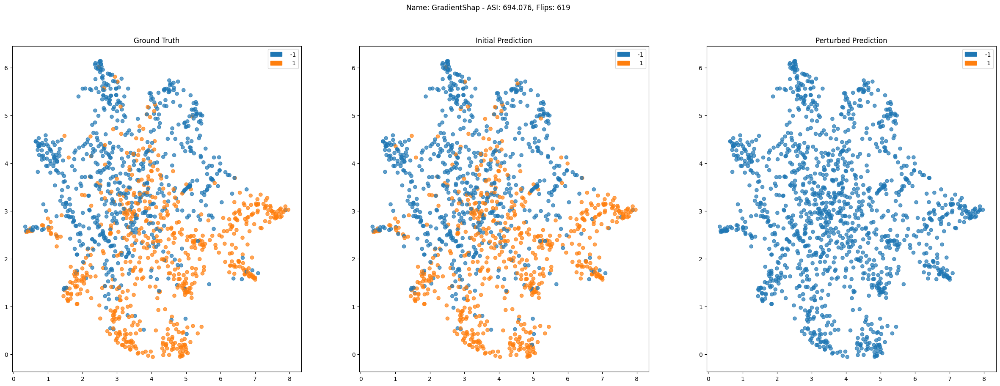

Name: DeepLift
ASI: 705.146, Flips: 619


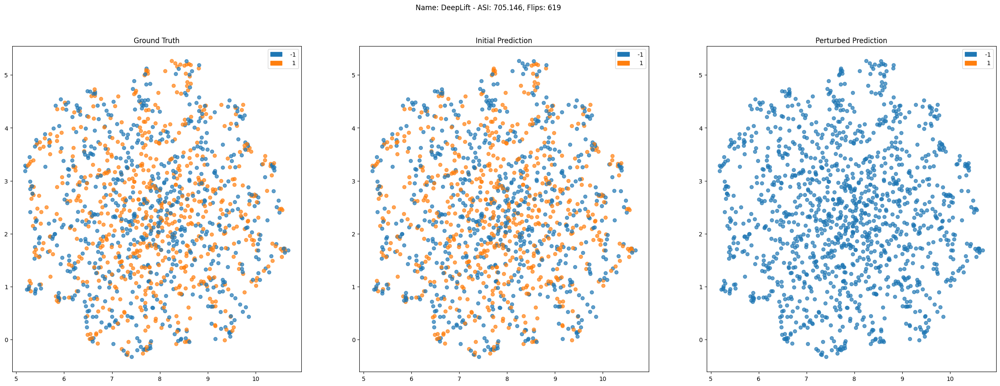

Name: DeepLiftShap
ASI: 714.969, Flips: 619


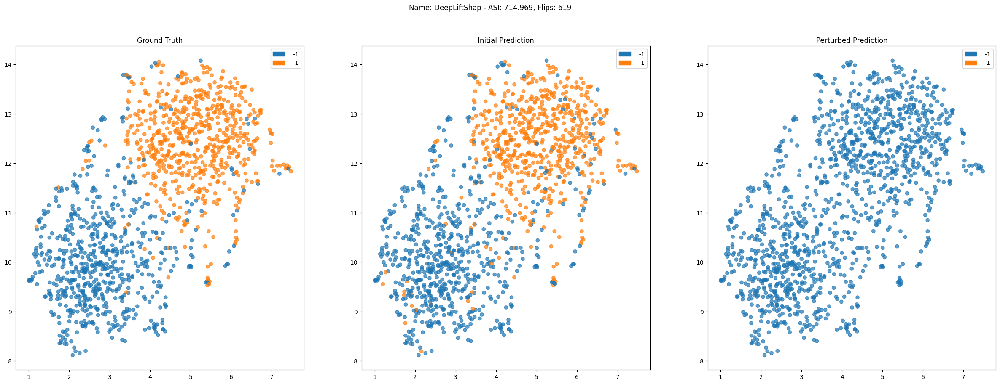

Name: IntegratedGradients
ASI: 704.352, Flips: 619


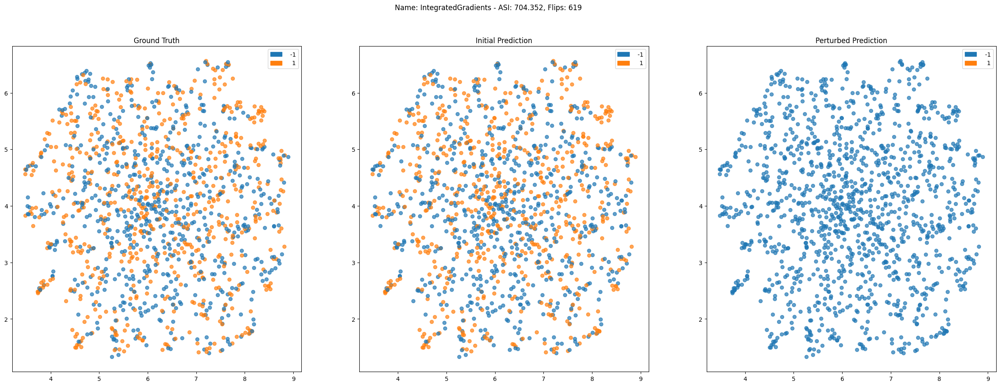

In [42]:
generate_projections(ret_test, labels=list(np.unique(y_train)))

In [34]:
torch.save(model, 'models/ford-a-resnet.pth')

# Check hyperparameters

In [29]:
from itertools import product

loader = dataloader_train_not_shuffled

weights_to_test = ['amax', 'js', 'ts', 'att']
weights_boundaries = [0, 3, 1]

def define_weights(dimensions, boundaries):
    low_bound, high_bound, steps = boundaries
    scaled_steps = 1 / steps
    high_bound = int(high_bound * scaled_steps + 1)
    return np.array(list(product(range(low_bound, high_bound), repeat=dimensions))) / scaled_steps

weights_to_test = define_weights(len(weights_to_test), weights_boundaries)

In [30]:
weights_to_test[1:,:], weights_to_test[1:,:].shape

(array([[0., 0., 0., 1.],
        [0., 0., 0., 2.],
        [0., 0., 0., 3.],
        ...,
        [3., 3., 3., 1.],
        [3., 3., 3., 2.],
        [3., 3., 3., 3.]]),
 (255, 4))

In [31]:
weights_to_test.shape[0] * 240 / 60 / 60

17.066666666666666

In [32]:
import os

import json

class NumpyArrayEncoder(json.JSONEncoder):
    def default(self, obj):
        if isinstance(obj, np.ndarray):
            return obj.tolist()
        if isinstance(obj, np.int64):
            return str(obj)
        if isinstance(obj, np.float32):
            return str(obj)
        return json.JSONEncoder.default(self, obj)
    
def checkpoint_save(file_name, data):
    if os.path.exists(file_name):
        with open(f'{file_name}', 'r+') as f:
            old_data = json.load(f)
    else:
        old_data = []
    old_data += data
    old_data_json = json.dumps(old_data, cls=NumpyArrayEncoder)
    with open(f'{file_name}', 'w+') as f:
        f.write(old_data_json)

In [33]:
file_name = 'forda-resnet-results'

results = []

for i, w_to_test in tq.tqdm(enumerate(weights_to_test[1:,:])):
    ret_dict = get_asi_for_dataset(loader, model, attribution_techniques, w_to_test, True, False)
    if i % 50 == 0:
        checkpoint_save(f'{file_name}.json', results)
        results = []
    results.append([i, w_to_test, ret_dict])
checkpoint_save(f'{file_name}.json', results)

0it [00:00, ?it/s]
  0%|          | 0/3601 [00:00<?, ?it/s]/home/schlegel/.conda/captum/lib/python3.10/site-packages/captum/_utils/gradient.py:57: UserWarning: Input Tensor 0 did not already require gradients, required_grads has been set automatically.
  warnings.warn(
  0%|          | 0/3601 [00:00<?, ?it/s]
0it [00:00, ?it/s]


type: 'bool' object is not callable